# Final Project Code - Adam Caspari

In [1]:
# Import the packages we will need
import networkx as nx
import osmnx as ox
from IPython.display import Image
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import geopandas as gpd
from descartes import PolygonPatch
from shapely.geometry import LineString
from shapely.geometry import Point
from shapely.geometry import Polygon

%matplotlib inline
weight_by_length = False
ox.__version__

'1.6.0'

In [2]:
# Import the bus stops data and reproject to NJ State Plane
df = pd.read_csv('data/Bus_Stops_of_NJ_Transit_by_Line.csv')
df
# print(df)
bus_stops = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.DLONG_GIS, df.DLAT_GIS)
)
bus_stops = bus_stops.set_crs('epsg:4326')

bus_stops = bus_stops.to_crs(3424) 

In [3]:
# Find stops on routes 24, 31, and 44 (also called the ONE bus routes)
one_bus_stops = bus_stops[(bus_stops["LINE"] == 24) | (bus_stops["LINE"] == 31) | (bus_stops["LINE"] == 44)]

In [4]:
one_bus_stops

,X,Y,OBJECTID,COUNTY,DESCRIPTION_BSL,DIRECTION_OP,DLAT_GIS,DLONG_GIS,LINE,MUNICIPALITY,STOP_NUM,STOP_TYPE,STREET_DIR,HEADING,geometry
7567,-8.263247e+06,4.978832e+06,7568,Essex,MAIN ST AT DAY ST,Ou,40.77245,-74.22999,24,ORANGE,17387,FS,W,297,POINT (566905.109 706413.773)
7569,-8.263247e+06,4.978832e+06,7570,Essex,MAIN ST AT DAY ST,Ou,40.77245,-74.22999,44,ORANGE,17387,FS,W,297,POINT (566905.109 706413.773)
7574,-8.263713e+06,4.979078e+06,7575,Essex,MAIN ST 100' W OF HIGH ST,Ou,40.77410,-74.23420,24,ORANGE,17388,MB,W,304,POINT (565737.314 707011.306)
7579,-8.263926e+06,4.979225e+06,7580,Essex,MAIN ST 80' W OF BELL ST,Ou,40.77508,-74.23613,24,ORANGE,17389,MB,W,305,POINT (565201.734 707366.706)
7600,-8.263389e+06,4.978723e+06,7601,Essex,RR PLACE AT ESSEX AVE/S DAY ST,Ou,40.77169,-74.23128,44,ORANGE,17403,FS,E,111,POINT (566548.687 706135.809)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28523,-8.257354e+06,4.972144e+06,28524,Essex,BROAD ST AT CAMP ST,In,40.72690,-74.17704,24,NEWARK,30632,NS,N,24,POINT (581630.854 689869.560)
28594,-8.257964e+06,4.974897e+06,28595,Essex,CENTRAL AVENUE AT NORFOLK STREET,Ou,40.74564,-74.18256,24,NEWARK,30636,FS,W,291,POINT (580076.343 696690.908)
28597,-8.257964e+06,4.974897e+06,28598,Essex,CENTRAL AVENUE AT NORFOLK STREET,Ou,40.74564,-74.18256,44,NEWARK,30636,FS,W,291,POINT (580076.343 696690.908)
28986,-8.259379e+06,4.968570e+06,28987,Essex,FRELINGHUYSEN AVE AT MEEKER AVE,Ou,40.70256,-74.19523,24,NEWARK,31872,NS,N,24,POINT (576620.395 680984.586)


In [5]:
# Find all areas within one mile of 24, 31, and 44 bus stops
one_bus_buffer = one_bus_stops.buffer(5280)

In [6]:
# Get bounding box of ONE Bus buffer
one_bus_buffer.to_crs(4326).total_bounds

array([-74.28061649,  40.63210627, -74.14422657,  40.79048343])

In [7]:
gpd.GeoDataFrame(index=[0], 
                 crs='epsg:3424', 
                 geometry=[one_bus_buffer.unary_union]).explore(height = 450)

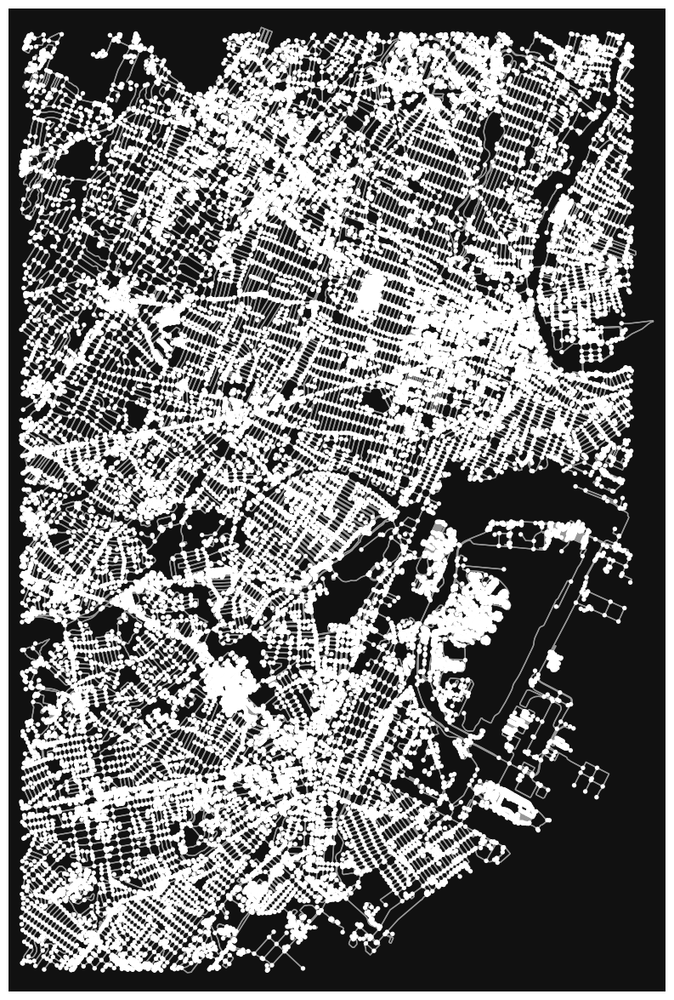

In [8]:
# Use bouding box coordinates of ONE bus buffer to define the extent of OSM Street Network data to download from OSMNx
G = ox.graph_from_bbox(40.79048343, 40.63210627, -74.14422657, -74.28061649, network_type="walk") 
fig, ax = ox.plot_graph(G, figsize=(15, 15))

In [9]:
G_proj = ox.project_graph(G) # UTM ZONES that the graph 
nodes_proj = ox.graph_to_gdfs(G_proj, edges=False)
nodes_proj = nodes_proj.to_crs("EPSG:3424") # convert to NJ state plane

In [10]:
trip_times = [5, 10, 15]
iso_colors = ox.plot.get_colors(n=len(trip_times), cmap="plasma", start=0, return_hex=True)

In [11]:
# These nodes represent central intersections in Downtown Newark and Downtown Elizabeth which are major desinations opn the 24, 31, and 44
# Only routes that have a stop within a 10 minute walk of these intersections are considered viable alternatives to the 24, 31, and 44
center_nodes = [105444345, 103686096]
travel_speed = 4.5  # use 4.5 km/h walking speed when calculating walk distance

In [12]:
# Get Travel time for each edge
meters_per_minute = travel_speed * 1000 / 60  # km per hour to m per minute
for _, _, _, data in G.edges(data=True, keys=True):
    data["time"] = data["length"] / meters_per_minute # get time to travel over edge

1
2


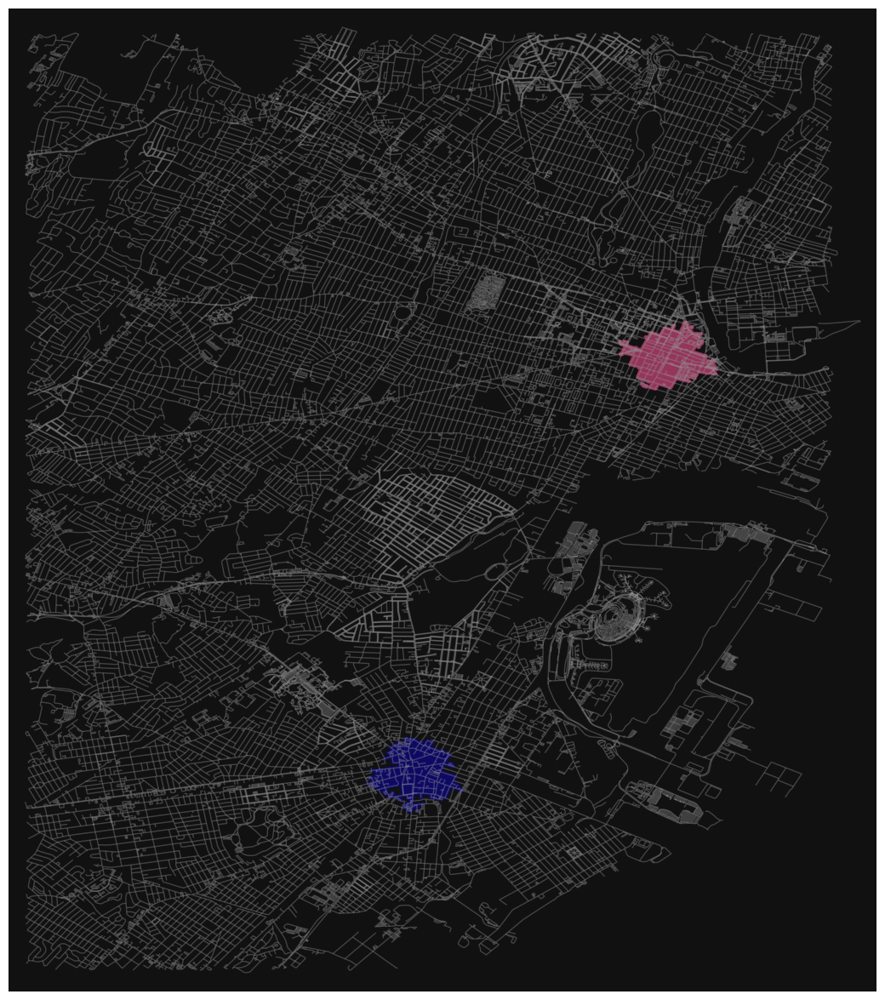

In [13]:
# Code adapted from Network Analysis lab - modified to calculate nework buffers for two separate nodes (but with only one time - 10 mins)
def make_iso_polys(G, center_nodes, trip_time, edge_buff=25, node_buff=50, infill=False):
    isochrone_polys = []
    counter = 0
    for center_node in center_nodes:
        counter += 1
        print(counter)
        subgraph = nx.ego_graph(G, center_node, radius=trip_time, distance="time")

        gdf_nodes, gdf_edges = ox.graph_to_gdfs(subgraph, edges=True)
        gdf_edges = gdf_edges.to_crs("EPSG:3424") # convert to feet crs

        e = gdf_edges.buffer(edge_buff)
        e = e.to_crs("EPSG:4326") # convert back to geographic coordinate system
        new_iso = e.unary_union # merge into one polygon


        # try to fill in surrounded areas so shapes will appear solid and
        # blocks without white space inside them
        if infill:
            new_iso = Polygon(new_iso.exterior)
        isochrone_polys.append(new_iso)

    return isochrone_polys


isochrone_polys = make_iso_polys(G, center_nodes, 10, edge_buff=100, node_buff=0, infill=True)
fig, ax = ox.plot_graph(
    G, show=False, close=False, edge_color="#999999", edge_alpha=0.2, node_size=0, figsize = (15,15)
)
for polygon, fc in zip(isochrone_polys, iso_colors):
    patch = gpd.GeoDataFrame(geometry = [polygon], crs = "EPSG:3426")
    patch.plot(ax = ax, alpha = 0.7, color = fc, zorder = -1)
plt.show()

In [14]:
# Convert newark/elizabth downtown network buffer to dataframe and reproject to NJ State Plane
newark_elizabeth_downtowns = gpd.GeoDataFrame(index=[0, 1], 
                 crs='epsg:4326', 
                 geometry=isochrone_polys)
newark_elizabeth_downtowns = newark_elizabeth_downtowns.to_crs(3424)

In [15]:
# find all bus stops located in downtown newark/elizabeth
downtown_bus_stops = bus_stops.clip(newark_elizabeth_downtowns)

In [16]:
# # Eliminate 24, 31, 44 stops from our lsit of downtown bus stops
downtown_bus_stops_no_one = downtown_bus_stops[~downtown_bus_stops["LINE"].isin([24, 31, 44])]

In [17]:
# Get all routes that have stops in in Downtown Newark/Elizabeth
downtown_bus_liness_no_one = downtown_bus_stops_no_one.LINE.unique()

In [18]:
# Get all stops that are 1. On a route that serves Downtowwn Newark/Elizabeth
#                        2. Within one mile of a ONE bus stop (to save processing time)
stops_on_downtown_line_no_one = bus_stops[bus_stops["LINE"].isin(downtown_bus_liness_no_one)].clip(one_bus_buffer)

In [19]:
# adapted from in-class code - finds the closest OSM node to a geometry
def get_closest_network_node(p):
    # p an d nodes_proj, needs to be in the same projected crs    
    ps = nodes_proj.copy()
    ps["geometry"] =  p["geometry"]
    p_node = nodes_proj.distance(ps).nsmallest(1).index[0]
    return p_node

In [20]:
# Find the closest OSM node to each stop on a bus route serving downtown
stops_on_downtown_line_no_one["closest_node"] = stops_on_downtown_line_no_one.apply(get_closest_network_node, axis=1)

In [21]:
# Find the closest OSM node to each stop on the 24, 31, 44
one_bus_stops["closest_node"] = one_bus_stops.apply(get_closest_network_node, axis=1)

/opt/conda/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [22]:
# This code can require ~15 minutes to run
# Calculate 10 minute nework buffers around each stop on 24, 31, 44 routes and on all other routes that serve downtowns
stops_on_one_bus_isochrone = make_iso_polys(G, one_bus_stops["closest_node"].to_list(), 10, edge_buff=100, node_buff=0, infill=True)
stops_on_downtown_line_no_one_isochrone = make_iso_polys(G, stops_on_downtown_line_no_one["closest_node"].to_list(), 10, edge_buff=100, node_buff=0, infill=True)
# Convert network buffers to geodataframes
stops_on_one_bus_isochrone_gdf = gpd.GeoDataFrame(geometry=stops_on_one_bus_isochrone, crs=4326)
stops_on_downtown_line_no_one_isochrone_gdf = gpd.GeoDataFrame(geometry=stops_on_downtown_line_no_one_isochrone, crs=4326)
# Disolve separate network buffers for each stop into a single combined network buffer
one_bus_network_buffer = stops_on_one_bus_isochrone_gdf.dissolve()
downtown_line_no_one_network_buffer = stops_on_downtown_line_no_one_isochrone_gdf.dissolve()

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


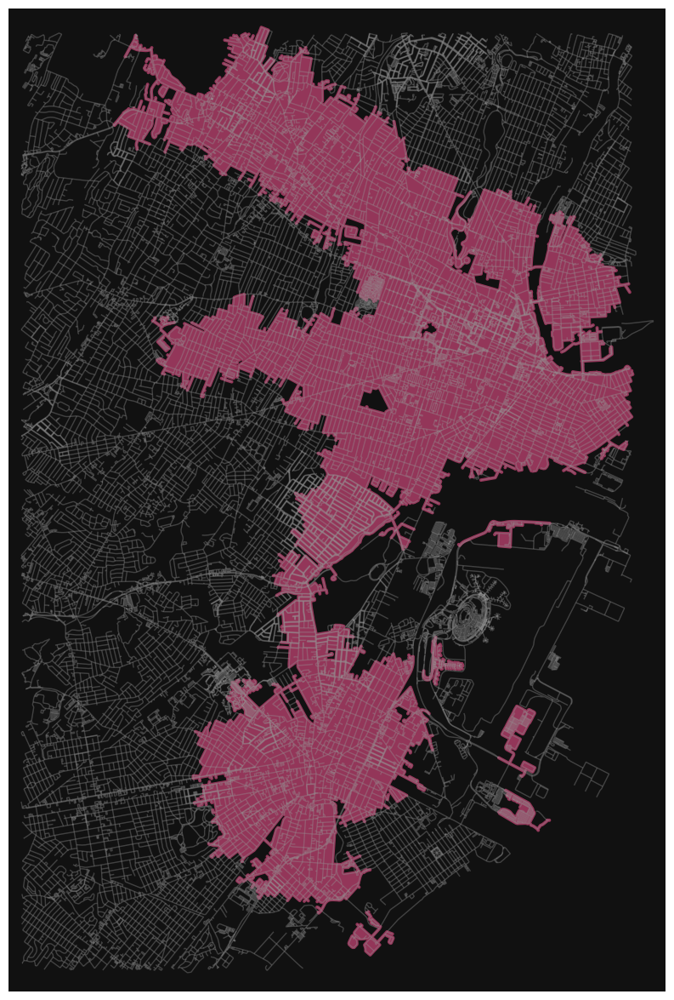

In [23]:
# Plot network buffer for other routes serving downtown Newark/Elizabeth
fig, ax = ox.plot_graph(
    G, show=False, close=False, edge_color="#999999", edge_alpha=0.2, node_size=0, figsize = (15,15)
)
downtown_line_no_one_network_buffer.plot(ax = ax, alpha = 0.7, color = fc, zorder = -1)
plt.show()

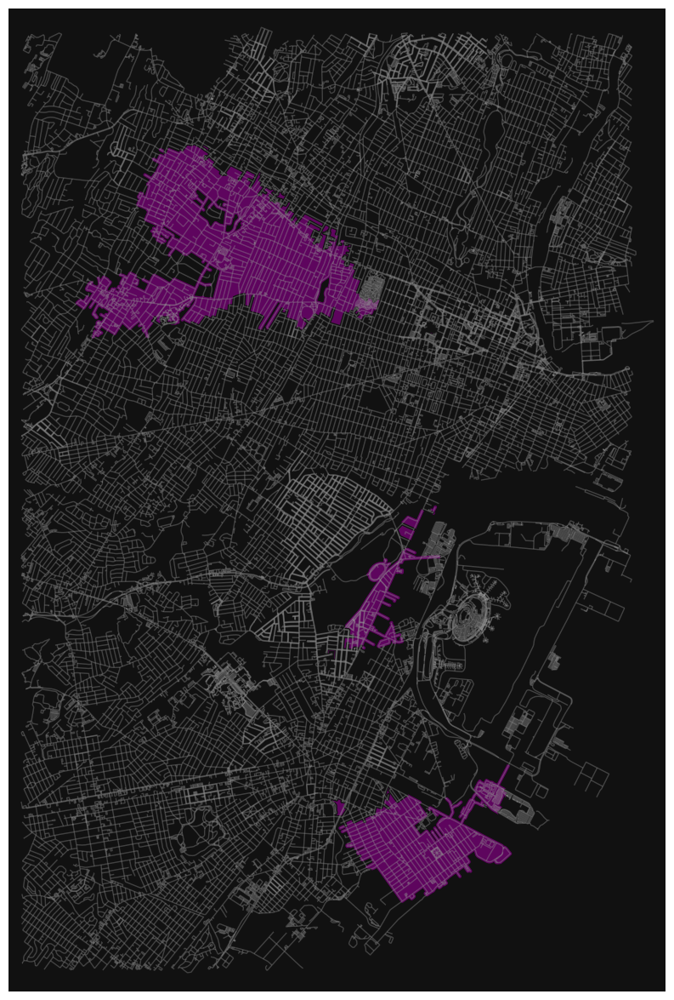

In [24]:
# Find areas served by 24, 31, 44 routes not served by other routes that travel to downtowns
one_bus_unserved_areas = one_bus_network_buffer.overlay(downtown_line_no_one_network_buffer, how='difference')
# Plot areas served by 24, 31, 44 routes not served by other routes that travel to downtowns
fig, ax = ox.plot_graph(
    G, show=False, close=False, edge_color="#999999", edge_alpha=0.2, node_size=0, figsize = (15,15)
)
one_bus_unserved_areas.plot(ax = ax, alpha = 0.7, color = "purple", zorder = -1)
plt.show()

In [25]:
# Reproject areas served by 24, 31, 44 routes not served by other routes that travel to downtowns
one_bus_unserved_areas = one_bus_unserved_areas.to_crs(3424)

In [26]:
!pip install census # the library is not preloaded in this docker container

In [27]:
pip install --upgrade geopandas mapclassify folium

Note: you may need to restart the kernel to use updated packages.


In [28]:
# more imports for getting census data - some of these may be duplicates
import pandas as pd 
import geopandas as gpd
import matplotlib as mpl
import folium
from matplotlib import pyplot as plt
import matplotlib.patheffects as pe
import mapclassify
import contextily as ctx 

plt.rcParams["figure.figsize"] = (10,10) # set this once for the whole notebook to increase the size of output plots

from census import Census

In [29]:
# Initialize Census variable with no API key
c = Census("")

In [30]:
# Use Census API tyo get data fram decenial census table P2, which includes population by race/ethnicity
nj_census = c.pl.state_county_blockgroup(fields = ('NAME', 'P2_001N', 'P2_002N', 'P2_003N', 'P2_005N', 'P2_006N', 'P2_007N', 'P2_008N', 'P2_009N', 'P2_010N', 'P2_011N'),
                                      state_fips = 34, # New Jersey's FIPS code is 34
                                      county_fips = "*", # an asterisk means all options; use it here to get all the counties within New Jersey
                                      blockgroup = "*", # get all the tracts within these counties
                                      year = 2020)

In [31]:
# verify data was imported properly
nj_census

[{'NAME': 'Block Group 2, Census Tract 551, Bergen County, New Jersey',
  'P2_001N': 1012.0,
  'P2_002N': 61.0,
  'P2_003N': 951.0,
  'P2_005N': 726.0,
  'P2_006N': 12.0,
  'P2_007N': 0.0,
  'P2_008N': 163.0,
  'P2_009N': 0.0,
  'P2_010N': 16.0,
  'P2_011N': 34.0,
  'state': '34',
  'county': '003',
  'tract': '055100',
  'block group': '2'},
 {'NAME': 'Block Group 5, Census Tract 551, Bergen County, New Jersey',
  'P2_001N': 968.0,
  'P2_002N': 72.0,
  'P2_003N': 896.0,
  'P2_005N': 629.0,
  'P2_006N': 16.0,
  'P2_007N': 0.0,
  'P2_008N': 220.0,
  'P2_009N': 0.0,
  'P2_010N': 3.0,
  'P2_011N': 28.0,
  'state': '34',
  'county': '003',
  'tract': '055100',
  'block group': '5'},
 {'NAME': 'Block Group 2, Census Tract 552.01, Bergen County, New Jersey',
  'P2_001N': 1290.0,
  'P2_002N': 82.0,
  'P2_003N': 1208.0,
  'P2_005N': 832.0,
  'P2_006N': 9.0,
  'P2_007N': 2.0,
  'P2_008N': 298.0,
  'P2_009N': 0.0,
  'P2_010N': 1.0,
  'P2_011N': 66.0,
  'state': '34',
  'county': '003',
  'tract'

In [32]:
# convert census data to dataframe
nj_census_df = pd.DataFrame(nj_census) 
nj_census_df.head()

,NAME,P2_001N,P2_002N,P2_003N,P2_005N,P2_006N,P2_007N,P2_008N,P2_009N,P2_010N,P2_011N,state,county,tract,block group
0,"Block Group 2, Census Tract 551, Bergen County...",1012.0,61.0,951.0,726.0,12.0,0.0,163.0,0.0,16.0,34.0,34,003,055100,2
1,"Block Group 5, Census Tract 551, Bergen County...",968.0,72.0,896.0,629.0,16.0,0.0,220.0,0.0,3.0,28.0,34,003,055100,5
2,"Block Group 2, Census Tract 552.01, Bergen Cou...",1290.0,82.0,1208.0,832.0,9.0,2.0,298.0,0.0,1.0,66.0,34,003,055201,2
3,"Block Group 2, Census Tract 552.02, Bergen Cou...",1060.0,82.0,978.0,507.0,25.0,0.0,408.0,0.0,11.0,27.0,34,003,055202,2
4,"Block Group 2, Census Tract 561, Bergen County...",1158.0,136.0,1022.0,865.0,6.0,0.0,110.0,0.0,5.0,36.0,34,003,056100,2


In [33]:
# Construct GEOID field that will be used for joining
nj_census_df["GEOID"] = nj_census_df["state"] + nj_census_df["county"] + nj_census_df["tract"] + nj_census_df["block group"] 
nj_census_df = nj_census_df.drop(columns = ["state", "tract", "county"])

In [34]:
# Calculate total nonwhite population of blockgroups
nj_census_df["pop_nonwhite"] = (nj_census_df["P2_002N"]+
  nj_census_df["P2_006N"]+
  nj_census_df["P2_007N"]+
  nj_census_df["P2_008N"]+
  nj_census_df["P2_009N"]+
  nj_census_df["P2_010N"]+
  nj_census_df["P2_011N"])

In [35]:
# proportion of nonwhite population
nj_census_df["prop_nonwhite"] = nj_census_df["pop_nonwhite"]/nj_census_df["P2_001N"]
# proportion of nonwhite population
nj_census_df["prop_nonwhite"] = nj_census_df["pop_nonwhite"]/nj_census_df["P2_001N"]

In [36]:
nj_census_df

,NAME,P2_001N,P2_002N,P2_003N,P2_005N,P2_006N,P2_007N,P2_008N,P2_009N,P2_010N,P2_011N,block group,GEOID,pop_nonwhite,prop_nonwhite
0,"Block Group 2, Census Tract 551, Bergen County...",1012.0,61.0,951.0,726.0,12.0,0.0,163.0,0.0,16.0,34.0,2,340030551002,286.0,0.282609
1,"Block Group 5, Census Tract 551, Bergen County...",968.0,72.0,896.0,629.0,16.0,0.0,220.0,0.0,3.0,28.0,5,340030551005,339.0,0.350207
2,"Block Group 2, Census Tract 552.01, Bergen Cou...",1290.0,82.0,1208.0,832.0,9.0,2.0,298.0,0.0,1.0,66.0,2,340030552012,458.0,0.355039
3,"Block Group 2, Census Tract 552.02, Bergen Cou...",1060.0,82.0,978.0,507.0,25.0,0.0,408.0,0.0,11.0,27.0,2,340030552022,553.0,0.521698
4,"Block Group 2, Census Tract 561, Bergen County...",1158.0,136.0,1022.0,865.0,6.0,0.0,110.0,0.0,5.0,36.0,2,340030561002,293.0,0.253022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6594,"Block Group 4, Census Tract 375, Union County,...",2282.0,305.0,1977.0,1423.0,217.0,0.0,236.0,0.0,17.0,84.0,4,340390375004,859.0,0.376424
6595,"Block Group 1, Census Tract 376.01, Union Coun...",2051.0,193.0,1858.0,1532.0,115.0,0.0,127.0,0.0,12.0,72.0,1,340390376011,519.0,0.253047
6596,"Block Group 3, Census Tract 376.01, Union Coun...",1062.0,126.0,936.0,774.0,50.0,0.0,91.0,0.0,0.0,21.0,3,340390376013,288.0,0.271186
6597,"Block Group 1, Census Tract 376.02, Union Coun...",1896.0,214.0,1682.0,1384.0,92.0,0.0,121.0,0.0,25.0,60.0,1,340390376021,512.0,0.270042


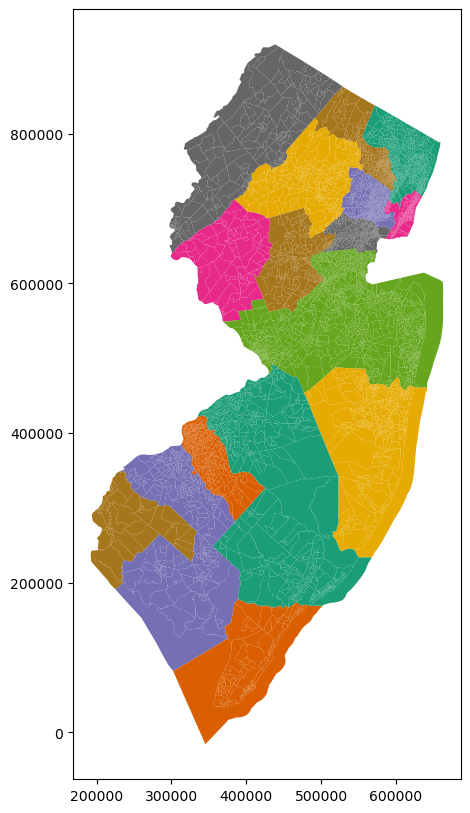

In [37]:
# Get TIGER Census spatial blockgroup data and reproject to NJ State Plane
url_nj_blockgroups = r'https://www2.census.gov/geo/tiger/TIGER2020PL/STATE/34_NEW_JERSEY/34/tl_2020_34_bg20.zip'
nj_blockgroups = gpd.read_file(url_nj_blockgroups)
nj_blockgroups = nj_blockgroups.to_crs(3424)
nj_blockgroups.plot("COUNTYFP20", cmap = 'Dark2') # note that the column name is slightly different from the Census download
plt.show()


In [38]:
# Calculate area of blockgroups
nj_blockgroups["area_calc"] = nj_blockgroups.area
nj_blockgroups[["ALAND20","AWATER20","area_calc"]]

,ALAND20,AWATER20,area_calc
0,1241976,105122,1.449712e+07
1,2863331,159099,3.252656e+07
2,839903,0,9.038790e+06
3,1011392,181409,1.283663e+07
4,2685796,7052,2.897987e+07
...,...,...,...
6594,16038106,248828,1.752761e+08
6595,14275022,63435,1.543073e+08
6596,5027623,70157,5.486101e+07
6597,3490966,41862,3.801968e+07


In [39]:
# Join Census population/race data with blockgroup spatial data to allow us to map census variables
nj_blockgroups_census = nj_blockgroups.merge(nj_census_df, left_on = "GEOID20", right_on = "GEOID") # join demo info and geographies based on GEOID field


In [40]:
# Calculate population density
nj_blockgroups_census["pop_den"] = 5280*5280*(nj_blockgroups_census["P2_001N"]/(nj_blockgroups_census["area_calc"]*(nj_blockgroups_census["ALAND20"]/(nj_blockgroups_census["ALAND20"]+nj_blockgroups_census["AWATER20"]))))

In [41]:
# Select only areas of blockgroups that are in areas that will be unserved if 24, 31, 44 routes are eliminated
blockgroups_in_unserved_areas = nj_blockgroups_census.clip(one_bus_unserved_areas)

In [42]:
blockgroups_in_unserved_areas

,STATEFP20,COUNTYFP20,TRACTCE20,BLKGRPCE20,GEOID20,NAMELSAD20,MTFCC20,FUNCSTAT20,ALAND20,AWATER20,...,P2_007N,P2_008N,P2_009N,P2_010N,P2_011N,block group,GEOID,pop_nonwhite,prop_nonwhite,pop_den
4097,34,039,030500,2,340390305002,Block Group 2,G5030,S,260280,27258,...,3.0,14.0,0.0,23.0,28.0,2,340390305002,1579.0,0.931563,16869.645664
919,34,039,030400,3,340390304003,Block Group 3,G5030,S,131706,0,...,1.0,9.0,0.0,41.0,44.0,3,340390304003,2144.0,0.944910,44627.783346
4099,34,039,030500,4,340390305004,Block Group 4,G5030,S,137742,0,...,2.0,44.0,0.0,21.0,28.0,4,340390305004,1650.0,0.906593,34228.536420
4096,34,039,030500,1,340390305001,Block Group 1,G5030,S,89457,0,...,0.0,2.0,0.0,31.0,8.0,1,340390305001,884.0,0.947481,27017.845045
908,34,039,030400,4,340390304004,Block Group 4,G5030,S,126913,0,...,1.0,20.0,0.0,7.0,37.0,4,340390304004,1783.0,0.975383,37312.221144
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2854,34,013,018600,3,340130186003,Block Group 3,G5030,S,158704,0,...,0.0,0.0,0.0,12.0,26.0,3,340130186003,1149.0,0.984576,19048.495009
2855,34,013,018600,5,340130186005,Block Group 5,G5030,S,183124,0,...,5.0,7.0,0.0,2.0,25.0,5,340130186005,962.0,0.957214,14216.942507
2803,34,013,017900,2,340130179002,Block Group 2,G5030,S,235432,0,...,0.0,47.0,0.0,6.0,64.0,2,340130179002,586.0,0.661400,9748.787981
6399,34,013,017800,3,340130178003,Block Group 3,G5030,S,172703,0,...,2.0,24.0,0.0,17.0,25.0,3,340130178003,930.0,0.873239,15974.758112


<Axes: >

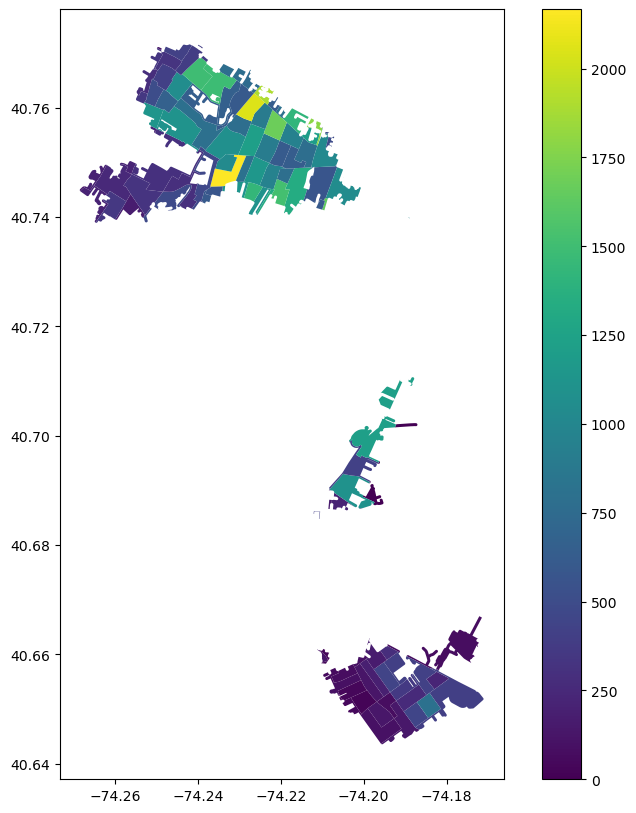

In [43]:
# View blockgrops in unserved areas on a map
blockgroups_in_unserved_areas.to_crs(4326).plot("P2_006N", cmap = 'viridis', legend = True)

In [44]:
# Get the area of a blockgroup that is in the area 
blockgroups_in_unserved_areas["area_unserved"] = blockgroups_in_unserved_areas.area
# Determine the proportion of the total block group area that will be unserved if 24, 31, 44 are eliminated
blockgroups_in_unserved_areas["proportion_unserved"] = blockgroups_in_unserved_areas["area_unserved"]/ blockgroups_in_unserved_areas["area_calc"]

In [45]:
blockgroups_in_unserved_areas[["area_calc","area_unserved", "proportion_unserved"]]

,area_calc,area_unserved,proportion_unserved
4097,3.094468e+06,2.035393e+06,0.657752
919,1.417415e+06,1.417415e+06,1.000000
4099,1.482350e+06,1.482350e+06,1.000000
4096,9.627173e+05,9.627173e+05,1.000000
908,1.365818e+06,1.365818e+06,1.000000
...,...,...,...
2854,1.707961e+06,8.489298e+05,0.497043
2855,1.970733e+06,1.461852e+06,0.741781
2803,2.533675e+06,3.704289e+05,0.146202
6399,1.858588e+06,9.584346e+05,0.515679


In [46]:
# Population density for unserved blockgroups
(blockgroups_in_unserved_areas["P2_001N"]*blockgroups_in_unserved_areas["proportion_unserved"]).sum()/(blockgroups_in_unserved_areas["area_unserved"]/5280/5280).sum()

16471.645070811785

In [47]:
# Total population of unserved blockgroups
(blockgroups_in_unserved_areas["P2_001N"]*blockgroups_in_unserved_areas["proportion_unserved"]).sum()

88654.420020006

In [48]:
# Total white population of unserved blockgroups
(blockgroups_in_unserved_areas["P2_005N"]*blockgroups_in_unserved_areas["proportion_unserved"]).sum()

7166.586705939169

In [49]:
# Total nonwhite population of unserved blockgroups
(blockgroups_in_unserved_areas["pop_nonwhite"]*blockgroups_in_unserved_areas["proportion_unserved"]).sum()

81487.83331406684

In [50]:
one_bus_stops_map = one_bus_stops.reset_index(drop=True)
one_bus_stops_map = one_bus_stops_map.to_crs(4326)

In [84]:
m = folium.Map(location=[40.7166807,-74.1906003], zoom_start=12, tiles='CartoDB positron')

one_bus_map_buffer = folium.FeatureGroup(name='Areas Within 10 Minute Walk of 24, 31, and 44 Routes',control=True)

one_bus_network_buffer_wm = one_bus_network_buffer.to_crs(epsg=4326)
for _, r in one_bus_network_buffer_wm.iterrows():
    # Without simplifying the representation of each borough,
    # the map might not be displayed
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=.000001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'fillColor': 'red', # fill color
                                                     'color': 'black', # line color
                                                     'weight': 2}) # line width (look at Folium docs to see the other parameters you can pass here)

    geo_j.add_to(one_bus_map_buffer)


downtown_line_no_one_map_buffer = folium.FeatureGroup(name='Areas Within 10 Minute Walk of Alternative Routes',control=True)

downtown_line_no_one_network_buffer_wm = downtown_line_no_one_network_buffer.to_crs(epsg=4326)
for _, r in downtown_line_no_one_network_buffer_wm.iterrows():
    # Without simplifying the representation of each borough,
    # the map might not be displayed
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=.000001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'fillColor': 'green', # fill color
                                                     'color': 'black', # line color
                                                     'weight': 2}) # line width (look at Folium docs to see the other parameters you can pass here)

    geo_j.add_to(downtown_line_no_one_map_buffer)

one_bus_map_buffer.add_to(m)
downtown_line_no_one_map_buffer.add_to(m)

folium.LayerControl().add_to(m)
m

In [85]:
m.save('areas_served_map.html')

In [52]:
nj_blockgroups

,STATEFP20,COUNTYFP20,TRACTCE20,BLKGRPCE20,GEOID20,NAMELSAD20,MTFCC20,FUNCSTAT20,ALAND20,AWATER20,INTPTLAT20,INTPTLON20,geometry,area_calc
0,34,001,012502,2,340010125022,Block Group 2,G5030,S,1241976,105122,+39.3440481,-074.5835582,"POLYGON ((464957.804 183602.155, 464990.703 18...",1.449712e+07
1,34,001,012602,1,340010126021,Block Group 1,G5030,S,2863331,159099,+39.3267130,-074.5714906,"POLYGON ((467622.461 180830.752, 467691.304 18...",3.252656e+07
2,34,001,012701,1,340010127011,Block Group 1,G5030,S,839903,0,+39.3264957,-074.6017962,"POLYGON ((460947.470 178359.220, 461105.843 17...",9.038790e+06
3,34,001,012701,2,340010127012,Block Group 2,G5030,S,1011392,181409,+39.3303157,-074.6165530,"POLYGON ((457589.675 181095.459, 457597.105 18...",1.283663e+07
4,34,013,021802,3,340130218023,Block Group 3,G5030,S,2685796,7052,+40.8614395,-074.2949349,"POLYGON ((543831.970 736949.351, 544179.276 73...",2.897987e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6594,34,037,371801,2,340373718012,Block Group 2,G5030,S,16038106,248828,+41.2044305,-074.6602180,"POLYGON ((436301.575 865444.449, 436342.456 86...",1.752761e+08
6595,34,037,371801,3,340373718013,Block Group 3,G5030,S,14275022,63435,+41.2339438,-074.6802867,"POLYGON ((433553.918 871216.527, 433767.460 87...",1.543073e+08
6596,34,037,371802,1,340373718021,Block Group 1,G5030,S,5027623,70157,+41.2088310,-074.6353185,"POLYGON ((450561.260 868033.489, 450630.524 86...",5.486101e+07
6597,34,037,373500,2,340373735002,Block Group 2,G5030,S,3490966,41862,+40.9857433,-074.7437011,"POLYGON ((422748.053 781980.846, 422825.040 78...",3.801968e+07


In [53]:
essex_union_blockgroups = nj_blockgroups_census[nj_blockgroups_census.COUNTYFP20.isin(["013", "039"])]
essex_union_blockgroups = essex_union_blockgroups.to_crs(3857)

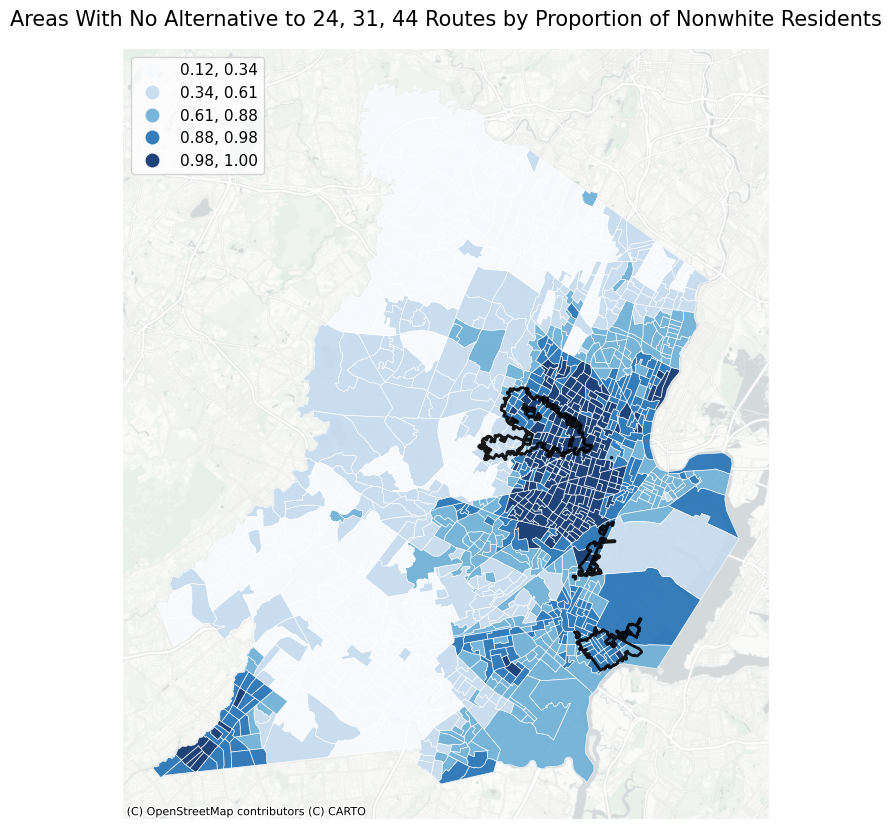

In [88]:
fig, ax = plt.subplots()
essex_union_blockgroups.plot(ax = ax, column = "prop_nonwhite", edgecolor = 'white', alpha = 0.9, linewidth = 0.5, cmap = 'Blues', legend = True, scheme='Quantiles',
                                              legend_kwds={
                                                      "loc":'upper left', # move the legend to upper left corner
                                                      "fmt":'{:,.2f}', # add thousand separators and remove decimals
                                                      "fontsize":11 # make the legend font a little bigger
                                              })
one_bus_unserved_areas.to_crs(3857).plot(ax = ax, edgecolor = 'black', facecolor="none", alpha = 0.9, linewidth = 2, legend = True, 
                                              legend_kwds={
                                                      "loc":'upper left', # move the legend to upper left corner
                                                      "fmt":'{:,.2f}', # add thousand separators and remove decimals
                                                      "fontsize":11 # make the legend font a little bigger
                                              })

ctx.add_basemap(ax, zoom=12,source=ctx.providers.CartoDB.PositronNoLabels); # add basemap behind vector layers

ax.axis('off') # get rid of the axis that show longitudes and latitudes


plt.title("Areas With No Alternative to 24, 31, 44 Routes by Proportion of Nonwhite Residents", fontsize = 15) # add title on top of map
fig.savefig("Areas With No Alternative to 24, 31, 44 Routes by Proportion of Nonwhite Residents.png") # export as PDF




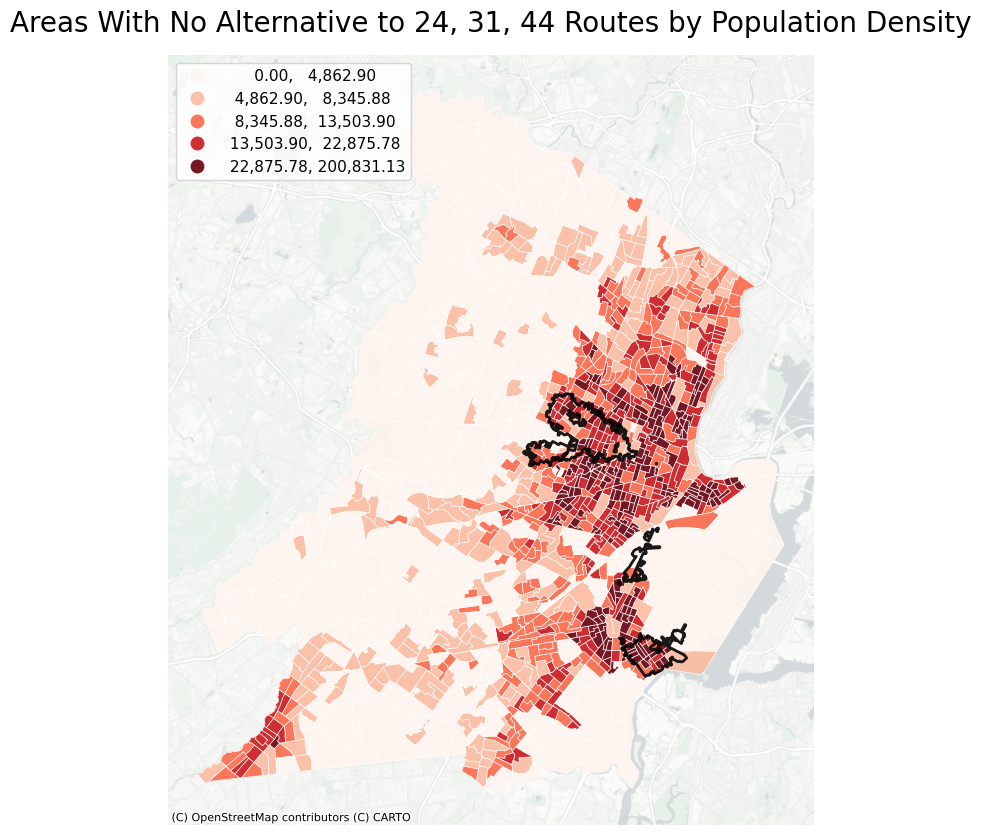

In [86]:
fig, ax = plt.subplots()
essex_union_blockgroups.plot(ax = ax, column = "pop_den", edgecolor = 'white', alpha = 0.9, linewidth = 0.5, cmap = 'Reds', legend = True, scheme='Quantiles',
                                              legend_kwds={
                                                      "loc":'upper left', # move the legend to upper left corner
                                                      "fmt":'{:,.2f}', # add thousand separators and remove decimals
                                                      "fontsize":11 # make the legend font a little bigger
                                              })
one_bus_unserved_areas.to_crs(3857).plot(ax = ax, edgecolor = 'black', facecolor="none", alpha = 0.9, linewidth = 2, legend = True, 
                                              legend_kwds={
                                                      "loc":'upper left', # move the legend to upper left corner
                                                      "fmt":'{:,.2f}', # add thousand separators and remove decimals
                                                      "fontsize":11 # make the legend font a little bigger
                                              })

ctx.add_basemap(ax, zoom=12,source=ctx.providers.CartoDB.PositronNoLabels); # add basemap behind vector layers

ax.axis('off') # get rid of the axis that show longitudes and latitudes


plt.title("Areas With No Alternative to 24, 31, 44 Routes by Population Density", fontsize = 20) # add title on top of map
fig.savefig("Areas With No Alternative to 24, 31, 44 Routes by Population Density.png") # export as PDF




In [68]:
# Import the rail stations data 
df_rail = pd.read_csv('data/Rail_Stations_of_NJ_Transit.csv')

rail_stations = gpd.GeoDataFrame(
    df_rail, geometry=gpd.points_from_xy(df_rail.LONGITUDE, df_rail.LATITUDE)
)
rail_stations = rail_stations.set_crs('epsg:4326')

In [82]:
one_bus_unserved_areas

m2 = folium.Map(location=[40.7166807,-74.1906003], zoom_start=12, tiles='CartoDB positron')

one_bus_unserved_areas_map = folium.FeatureGroup(name='Areas Losing Access to 24, 31, and 44 Routes With No Alternatives',control=True)

one_bus_unserved_areas_4326 = one_bus_unserved_areas.to_crs(epsg=4326)
for _, r in one_bus_unserved_areas_4326.iterrows():
    # Without simplifying the representation of each borough,
    # the map might not be displayed
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=.000001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'fillColor': 'red', # fill color
                                                     'color': 'black', # line color
                                                     'weight': 2}) # line width (look at Folium docs to see the other parameters you can pass here)

    geo_j.add_to(one_bus_unserved_areas_map)

one_bus_unserved_areas_map.add_to(m2)

# List of stops
rail_stations_list = [[point.xy[1][0], point.xy[0][0]] for point in rail_stations.geometry]

i = 0 # initialize counter at zero
for coordinates in rail_stations_list:   # Iterate through list and add a marker for each dispensary, color-coded by type
    folium.Marker(location = coordinates,
                  popup = folium.Popup("<b>Station Name:</b> " + str(rail_stations.STATION_ID[i]) + "<br><b>County:</b> " + str(rail_stations.COUNTY[i]) 
                  + "<br><b>Municipality:</b> " + str(rail_stations.MUNICIPALITY[i]), 
                  #max_width=len(f"name= {nj_cannabis_dispensaries.address[i]}")*20), 
                  color = 'blue',
                  fill_color='blue',
                  fill = True,
                  radius=5,
                  tooltip = str(rail_stations.STATION_ID[i]))).add_to(m2)
    i = i + 1


folium.LayerControl().add_to(m2)
m2

In [83]:
m2.save('rail_station_map.html')